In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
pip install protobuf==3.20.0

In [3]:
pip install opencv-python

In [4]:
pip install matplotlib

In [5]:
pip install mediapipe

  Using cached protobuf-4.25.4-cp37-abi3-manylinux2014_x86_64.whl.metadata (541 bytes)
Using cached protobuf-4.25.4-cp37-abi3-manylinux2014_x86_64.whl (294 kB)
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.0
    Uninstalling protobuf-3.20.0:
      Successfully uninstalled protobuf-3.20.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-metadata 1.15.0 requires protobuf<4.21,>=3.20.3; python_version < "3.11", but you have protobuf 4.25.4 which is incompatible.


In [6]:
pip install bm3d

# Image Enhancement Functions

In [7]:
# Histogram Equalization
def hist_equ(image):
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab_image)
    # Histogram before equalizing
    # plt.hist(l.flat, bins = 100, range = (0, 255))
    equ = cv2.equalizeHist(l)

    # Histogram after equalizing
    # plt.hist(equ.flat, bins = 100, range = (0, 255))
    updated_lab_image = cv2.merge((equ, a, b))
    hist_eq_image = cv2.cvtColor(updated_lab_image, cv2.COLOR_LAB2BGR)

    return hist_eq_image





def Edge_analyze(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply edge detection using the Canny algorithm
    edges = cv2.Canny(gray, 100, 200)

    # Calculate the standard deviation of the edge magnitudes
    # The edge magnitudes are calculated using gradients of the image
    edge_mag = np.gradient(gray)
    # print(edge_mag)
    edge_std = np.std(edge_mag)
    # print(edge_std)
    return edge_std







# CLAHE
def clahe(image):
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab_image)

    # Histogram before equalizing
    # plt.hist(l.flat, bins = 100, range = (0, 255))

    # Create a CLAHE object
    clahe = cv2.createCLAHE(clipLimit=5.0, tileGridSize=(8, 8))

    # Apply CLAHE
    clahe_equ = clahe.apply(l)

    # Histogram after equalizing
    # plt.hist(clahe_equ.flat, bins = 100, range = (0, 255))

    updated_lab_image2 = cv2.merge((clahe_equ, a, b))

    clahe_image = cv2.cvtColor(updated_lab_image2, cv2.COLOR_LAB2BGR)

    # Return color image
    return clahe_image





# Luminance analysis
def analyze_luminance(image):
    # Convert the image to grayscale
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    h, s, v = cv2.split(hsv_image)



    # Calculate the average brightness
    avg_brightness = np.mean(v)

    median = np.median(v)

    # Find the maximum and minimum intensity values
    max_intensity = np.max(v)
    min_intensity = np.min(v)


    # Calculate the ratio between bright and dark regions
    bright_pixels = np.sum(v > 200)
    dark_pixels = np.sum(v < 60)
    total_pixels = np.prod(v.shape)
    bright_ratio = bright_pixels / total_pixels
    dark_ratio = dark_pixels / total_pixels
    '''
    print(f"Average Brightness: {avg_brightness:.2f}")
    print(f"Maximum Intensity: {max_intensity}")
    print(f"Minimum Intensity: {min_intensity}")
    print(f"Bright Ratio: {bright_ratio:.2f}")
    print(f"Dark Ratio: {dark_ratio:.2f}")
    '''
    if (avg_brightness < 60 and dark_ratio > 0.8) or max_intensity < 90:
        # print("It was under")
        # gamma correction
        v = np.array(255*(v / 255) ** 0.8, dtype = 'uint8')

    if (avg_brightness > 175 and bright_ratio > 0.6) or min_intensity > 60:
        # print("It was over")
        # gamma correction
        v = np.array(255*(v / 255) ** 1.5, dtype = 'uint8')

    # Adjust the saturation
    # s = np.clip(s * 1.2, 0, 255)

    #updated_image = cv2.merge((h, cv2.add(hsv_image[:, :, 1], 2), v))
    updated_image = cv2.merge((h, s, v))
    l_image = cv2.cvtColor(updated_image, cv2.COLOR_HSV2BGR)


    return l_image


def calculate_noise_level(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Calculate the standard deviation of pixel intensities
    noise_level = gray.std()
    return noise_level

def NLM_denoising(image):


    # Apply Non-Local Means Denoising
    denoised_image = cv2.fastNlMeansDenoisingColored(image, None, 6, 7, 21)
    return denoised_image
    '''
    noise_level = calculate_noise_level(image)
    # print(noise_level)
    if noise_level < 40:
    '''

    '''
    else:
      return image
    '''


def apply_color_correction(image, alpha=1.1, beta=20):
    # Apply simple brightness and contrast adjust
    adjusted_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return adjusted_image


def gaussian_denoising(image):
    # Apply Gaussian blur to the image
    denoised_image = cv2.GaussianBlur(image, (3, 3), 0)
    return denoised_image

def median_denoising(image):
    # Apply median blur to the image
    denoised_image = cv2.medianBlur(image, 3)
    return denoised_image

def bilateral_denoising(image):
    # Apply bilateral filter to the image
    denoised_image = cv2.bilateralFilter(image, 9, 75, 75)
    return denoised_image


def bm3d_denoise(image):
    noise_level = calculate_noise_level(image)
    # print(noise_level)
    if noise_level < 40:
      # Apply BM3D denoising
      denoised_image = bm3d.bm3d(image, 5)
      # Normalize the image to the range [0, 255] if necessary
      normalized_image = cv2.normalize(denoised_image, None, 0, 255, cv2.NORM_MINMAX)
      # Convert to 8-bit format
      image_uint8 = cv2.convertScaleAbs(normalized_image)
      return image_uint8
    else:
      return image


def denoise_sharpen(image):
    #edge_measure = Edge_analyze(image)
    # print(edge_measure)
    denoised_image = cv2.fastNlMeansDenoisingColored(image, None, 12, 7, 21)
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    sharpened_image = cv2.filter2D(denoised_image, -1, kernel)
    return sharpened_image



In [8]:
pip install mediapipe opencv-python

# Real World Problem(First Model)


In [9]:
import cv2
import matplotlib.pyplot as plt
import mediapipe as mp
import math
import numpy as np
import os

def convert_to_rgb(image):
    rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return rgb_image

# Function to detect faces in an image
def detect_faces_1(image_rgb, image):

    # Initialize the MediaPipe Face Detection model
    mp_face_detection = mp.solutions.face_detection
    # Face Detector
    face_detector = mp_face_detection.FaceDetection(min_detection_confidence=0.5)

    # Detect faces in the image
    results = face_detector.process(image_rgb)

    # Get the image dimensions
    h, w, _ = image.shape

    # Draw bounding boxes around the detected faces
    if results.detections:
        for detection in results.detections:
            # Get the bounding box coordinates
            bboxC = detection.location_data.relative_bounding_box
            x, y, w, h = int(bboxC.xmin * w), int(bboxC.ymin * h), \
                         int(bboxC.width * w), int(bboxC.height * h)

            # Draw the bounding box on the image
            cv2.rectangle(image, (x, y), (x + w, y + h), (255, 255, 0), 3)

    return image







def detect_smiles_1(image_rgb, image):

    # Initialize Mediapipe Face Mesh
    mp_face_mesh = mp.solutions.face_mesh

    # Landmark Detector
    face_mesh_detector = mp_face_mesh.FaceMesh(min_detection_confidence=0.5)


    # Process the image for face mesh detection
    results = face_mesh_detector.process(image_rgb)

    # mouth landmark indices (left corner, right corner, upper lip, lower lip)
    mouth_indices = [
       78, 306, 11 , 14
    ]

    mouth_landmarks = [] # For working with landmarks
    mouth_points = [] # For drawing the landmarks

    # print(results.multi_face_landmarks)

    # Check for face
    if results.multi_face_landmarks:
        # Iteration on each face
        for face_landmarks in results.multi_face_landmarks:
            # Extract mouth landmarks and draw them
            for idx in mouth_indices:
                landmark = face_landmarks.landmark[idx]
                mouth_landmarks.append((landmark.x, landmark.y, landmark.z)) # This is normalized locations

                # Draw the landmarks on the image
                h, w, _ = image.shape
                x, y = int(landmark.x * w), int(landmark.y * h) # Change from normalized to the image cordinates
                mouth_points.append((x, y)) # For drawing a bounding box and showing landmarks
                # cv2.circle(image, (x, y), 7, (255, 0, 0), -1)  # Blue circle for landmarks


            left_corner = mouth_landmarks[0]   # Left corner of the mouth
            right_corner = mouth_landmarks[1]  # Right corner of the mouth
            upper_corner = mouth_landmarks[2]  # location of the upper lip
            lower_corner = mouth_landmarks[3]  # location of the lower lip

            '''
            print(left_corner)
            print(right_corner)
            print(lower_corner)
            '''


            # Extract mouth points for bboxC(Drawing Smile)
            left_point = mouth_points[0]
            right_point = mouth_points[1]
            upper_point = mouth_points[2]
            lower_point = mouth_points[3]


            horizontal_euqildean_distance = math.dist(left_corner[:2], right_corner[:2])
            vertical_euqildean_distance = math.dist(upper_corner[:2], lower_corner[:2])
            ratio = horizontal_euqildean_distance / vertical_euqildean_distance


            # print(horizontal_euqildean_distance)
            # print(vertical_euqildean_distance)
            print(ratio)


            # ((abs(left_corner[1] - lower_corner[1]) > 0.15) and )
            # and (abs(right_corner[1] - lower_corner[1] > 0.001))
            # and (abs(left_corner[1] - lower_corner[1] > 0.001)

            '''
            if ((left_corner[1] < lower_corner[1]) and (right_corner[1] < lower_corner[1]) and (ratio > 2.8) and (abs(right_corner[1] - lower_corner[1]) > 0.004) and (abs(left_corner[1] - lower_corner[1]) > 0.004)) or ((left_corner[1] > \
            lower_corner[1]) and (right_corner[1] < lower_corner[1]) and (abs(right_corner[1] - lower_corner[1]) > 0.004)  and (ratio > 5.9)) or ((left_corner[1] < \
            lower_corner[1]) and (right_corner[1] > lower_corner[1])  and (ratio > 5.9) and (abs(left_corner[1] - lower_corner[1]) > 0.004)) or \
            ((left_corner[1] > lower_corner[1]) and (right_corner[1] < lower_corner[1]) and (abs(right_corner[1] - lower_corner[1]) <= 0.004)  and (abs(left_corner[1] - lower_corner[1]) > 0.005) and (ratio > 6.5)) or \
            ((left_corner[1] < lower_corner[1]) and (right_corner[1] > lower_corner[1])  and (abs(left_corner[1] - lower_corner[1]) <= 0.004) and (abs(right_corner[1] - lower_corner[1]) > 0.005) and (ratio > 6.5)) or\
            ((left_corner[1] > lower_corner[1]) and (right_corner[1] > lower_corner[1]) and vertical_euqildean_distance > 0.03):
            '''
            # smile logic in first pipeline
            if ((left_corner[1] < lower_corner[1]) and (right_corner[1] < lower_corner[1]) and (ratio > 3.8) and (abs(right_corner[1] - lower_corner[1]) > 0.0026) and (abs(left_corner[1] - lower_corner[1]) > 0.0026)) or ((left_corner[1] > \
            lower_corner[1]) and (right_corner[1] < lower_corner[1]) and (abs(right_corner[1] - lower_corner[1]) > 0.0047)  and (ratio > 7)) or ((left_corner[1] < \
            lower_corner[1]) and (right_corner[1] > lower_corner[1])  and (ratio > 7) and (abs(left_corner[1] - lower_corner[1]) > 0.0047)) or \
            ((left_corner[1] > lower_corner[1]) and (right_corner[1] < lower_corner[1]) and (abs(right_corner[1] - lower_corner[1]) <= 0.0057)  and (ratio > 4.7) and (abs(left_corner[1] - lower_corner[1]) > 0.0057) and (ratio > 10)) or \
            ((left_corner[1] < lower_corner[1]) and (right_corner[1] > lower_corner[1])  and (ratio > 4.7) and (abs(left_corner[1] - lower_corner[1]) <= 0.0057) and (abs(right_corner[1] - lower_corner[1]) > 0.0057) and (ratio > 10)) or\
            ((left_corner[1] > lower_corner[1]) and (right_corner[1] > lower_corner[1]) and (vertical_euqildean_distance > 0.03)) or ((0.0031 <  lower_corner[1] - left_corner[1] < 0.0047) and (ratio > 18.2)) or ((0.0031 < lower_corner[1] - right_corner[1] < 0.0047) and (ratio > 18.2)):
                # Draw a rectangle around the mouth region if there is a smile
                # cv2.rectangle(image, (left_point[0], upper_point[1]), (right_point[0], lower_point[1]), (0, 0, 255), 3)
                cv2.putText(image, "Smile Detected", (30, 60), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 255), 3)
            else:
                cv2.putText(image, "No Smile", (30, 60), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 3)
    return image


def first_pipeline(image_path):
    # Load the image
    image = cv2.imread(image_path)

    if image.shape[0] < 1000 and image.shape[1] < 1000:
      image = cv2.resize(image, (1200, 1200), interpolation = cv2.INTER_LINEAR)

    # Create a copy of the image
    copied_image = np.copy(image)

    # clahe_image = clahe(image)

    l_image = analyze_luminance(image)

    if calculate_noise_level(l_image) > 80:
      l_image = NLM_denoising(l_image)
      # print(type(denoised_image))

    rgb_image = convert_to_rgb(l_image)

    # print(Edge_analyze(rgb_image))
    image_faces = detect_faces_1(rgb_image, copied_image)

    Final_image = detect_smiles_1(rgb_image, image_faces)



    return Final_image


# Real World Problem(Second Model)

In [10]:
import cv2
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
import numpy as np
import math
import os
import matplotlib.pyplot as plt
from typing import Tuple, Union



def mp_image_creator(image_path):
    mp_image = mp.Image.create_from_file(image_path)
    return mp_image


def calculate_slope(point_1, point_2):
  x1, y1 = point_1[:2]
  x2, y2 = point_2[:2]

  if x1 - x2 != 0:
    slope = (y2 - y1) / (x2 - x1)
  return slope


def convert_to_rgb(image):
    rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return rgb_image




def detect_smile(image, detection_result):
    landmark_indices = [78, 306, 11 , 15, 1] # left corner, right corner, upper, lower, nose tip
    mouth_landmarks = []
    mouth_points = []
    # Extract mouth landmarks and mouth points and draw the landmarks
    if detection_result:
        for face_landmarks in detection_result.face_landmarks:
            for idx in landmark_indices:
                landmark = face_landmarks[idx]
                mouth_landmarks.append((landmark.x, landmark.y, landmark.z))
                # print(landmark.z)

                # Draw the landmarks on the image
                h, w, _ = image.shape
                x, y = int(landmark.x * w), int(landmark.y * h)
                mouth_points.append((x, y))
                # cv2.circle(image, (x, y), 7, (255, 0, 0), -1)  # Green circle for landmarks

            left_corner = mouth_landmarks[0]   # Left corner of the mouth
            right_corner = mouth_landmarks[1]  # Right corner of the mouth
            upper_corner = mouth_landmarks[2]  # location of the upper corner
            lower_corner = mouth_landmarks[3]  # location of the lower corner
            nose_tip = mouth_landmarks[4] # locatio of the nose tip
            # middle_mouth = ((left_corner[0] + right_corner[0]) / 2, (left_corner[1] + right_corner[1]) / 2)
            '''
            print(upper_corner)
            print(lower_corner)
            print(left_corner)
            print(right_corner)
            '''
            '''
            print(f"Upper Point: {upper_corner}")
            print(f"Lower Point: {lower_corner}")
            print(f"Left Point: {left_corner}")
            print(f"Right Point: {right_corner}")
            print(f"Nose Tip: {nose_tip}")
            '''

            # vertical_slope = calculate_slope(upper_corner, lower_corner)
            # horizontal_slope = calculate_slope(left_corner, right_corner)
            # print(vertical_slope * horizontal_slope)
            # distance_left_to_middle = math.dist(left_corner[:2], middle_mouth[:2])
            # distance_right_to_middle = math.dist(right_corner[:2], middle_mouth[:2])
            #distance_left_to_nose = math.dist(left_corner[:2], nose_tip[:2])
            #distance_right_to_nose = math.dist(right_corner[:2], nose_tip[:2])
            #distance_upper_to_middle = math.dist(upper_corner[:2], middle_mouth[:2])
            #distance_lower_to_middle = math.dist(lower_corner[:2], middle_mouth[:2])
            #distance_upper_to_nose = math.dist(upper_corner[:2], nose_tip[:2])
            #distance_lower_to_nose = math.dist(lower_corner[:2], nose_tip[:2])
            #normalized_upper = distance_upper_to_middle / distance_upper_to_nose
            #normalized_lower = distance_lower_to_middle / distance_lower_to_nose
            #normalized_left = distance_left_to_middle / distance_left_to_nose
            #normalized_right = distance_right_to_middle / distance_right_to_nose
            # print(normalized_left + normalized_right)
            horizontal_euqlidean_distance = math.dist(left_corner[:2], right_corner[:2])
            vertical_euqlidean_distance = math.dist(upper_corner[:2], lower_corner[:2])
            ratio = horizontal_euqlidean_distance / vertical_euqlidean_distance
            left_to_nose = math.dist(left_corner[:2], nose_tip[:2])
            right_to_nose = math.dist(right_corner[:2], nose_tip[:2])
            pose_ratio = left_to_nose / right_to_nose
            '''
            print(f"horizontal distance: {horizontal_euqlidean_distance}")
            print(f"vertical distance: {vertical_euqlidean_distance}")
            print(f"ratio: {ratio}")
            print(f"Left Nose Distance: {left_to_nose}")
            print(f"Right Nose Distance: {right_to_nose}")
            print(f"ratio2: {pose_ratio}")
            '''
            '''
            print(horizontal_euqlidean_distance)
            print(vertical_euqlidean_distance)
            print(ratio)
            '''
            #print(normalized_left + normalized_right)
            #print(normalized_upper + normalized_lower)
            #print((normalized_left + normalized_right) / (normalized_upper + normalized_lower))


            left_point = mouth_points[0]
            right_point = mouth_points[1]
            upper_point = mouth_points[2]
            lower_point = mouth_points[3]


        # print(left_corner[1] - lower_corner[1])


        # Smile logic
            if ((left_corner[1] < lower_corner[1]) and (right_corner[1] < lower_corner[1]) and (ratio > 2.8) and (abs(right_corner[1] - lower_corner[1]) > 0.0055) and (abs(left_corner[1] - lower_corner[1]) > 0.0055) and (left_corner[1] > upper_corner[1]) and (right_corner[1] > upper_corner[1])) or \
            ((left_corner[1] < lower_corner[1]) and (right_corner[1] < lower_corner[1]) and (ratio > 2.3)  and (left_corner[1] > upper_corner[1]) and (right_corner[1] > upper_corner[1]) and (vertical_euqlidean_distance > 0.15)) or \
            ((left_corner[1] > lower_corner[1]) and (right_corner[1] < lower_corner[1]) and (abs(right_corner[1] - lower_corner[1]) > 0.004)  and (ratio > 5.9) and (left_corner[1] > upper_corner[1]) and (right_corner[1] > upper_corner[1])) or \
            ((left_corner[1] < lower_corner[1]) and (right_corner[1] > lower_corner[1])  and (ratio > 5.9) and (abs(left_corner[1] - lower_corner[1]) > 0.004) and (left_corner[1] > upper_corner[1]) and (right_corner[1] > upper_corner[1])) or \
            ((left_corner[1] > lower_corner[1]) and (right_corner[1] < lower_corner[1]) and (abs(right_corner[1] - lower_corner[1]) <= 0.004)  and (abs(left_corner[1] - lower_corner[1]) > 0.005) and (ratio > 6.5) and (left_corner[1] > upper_corner[1]) and (right_corner[1] > upper_corner[1])) or \
            ((left_corner[1] < lower_corner[1]) and (right_corner[1] > lower_corner[1])  and (abs(left_corner[1] - lower_corner[1]) <= 0.004) and (abs(right_corner[1] - lower_corner[1]) > 0.005) and (ratio > 6.5) and (left_corner[1] > upper_corner[1]) and (right_corner[1] > upper_corner[1])) or\
            ((left_corner[1] > lower_corner[1]) and (right_corner[1] > lower_corner[1]) and (vertical_euqlidean_distance > 0.03) and (ratio > 6.5)) or \
            ((left_corner[1] < upper_corner[1]) and (right_corner[1] < upper_corner[1]) and (vertical_euqlidean_distance > 0.034) and (ratio > 7.0)) or \
            ((left_corner[1] < upper_corner[1]) and (right_corner[1] > upper_corner[1]) and (vertical_euqlidean_distance > 0.07) and (ratio > 3.0)) or \
            ((left_corner[1] > upper_corner[1]) and (right_corner[1] < upper_corner[1]) and (vertical_euqlidean_distance > 0.07) and (ratio > 3.0)) or \
            (((0.75 > pose_ratio) or  (pose_ratio > 1.5)) and (vertical_euqlidean_distance > 0.024) and (ratio > 6.0)) or \
            (((0.75 > pose_ratio) or  (pose_ratio > 1.5)) and (vertical_euqlidean_distance > 0.1) and (ratio > 2.8)):
                # Draw a rectangle around the mouth region
                # cv2.rectangle(image, (left_point[0], upper_point[1]), (right_point[0] , lower_point[1]), (0, 255, 0), 2)
                cv2.putText(image, "Smile Detected", (30, 60), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 3)
            else:
                cv2.putText(image, "No Smile", (30, 60), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 255), 3)


    return image



def detect_faces(image, detection_result):
    """Draws bounding boxes on the input image and return it.

    Args:
        image: The input RGB image.
        detection_result: The list of all "Detection" entities to be visualized.

    Returns:
        Image with bounding boxes.
    """
    annotated_image = image.copy()
    height, width, _ = image.shape

    for detection in detection_result.detections:
        # Draw bounding box
        bbox = detection.bounding_box
        start_point = (int(bbox.origin_x), int(bbox.origin_y))
        end_point = (int(bbox.origin_x + bbox.width), int(bbox.origin_y + bbox.height))
        cv2.rectangle(annotated_image, start_point, end_point, (0, 255, 255), 2)

    return annotated_image







def second_pipeline(np_image):

    copy_image = np_image.copy()


    l_image = analyze_luminance(np_image)


    # print(Edge_analyze_2(l_image))
    # print(Edge_analyze(l_image))


    if Edge_analyze(l_image) < 1.7:
      l_image = denoise_sharpen(l_image)
      # print(Edge_analyze(l_image))

      # l_image = clahe(l_image)

      # print(calculate_noise_level(l_image))
      if 1.17 < Edge_analyze(l_image) < 1.3:
      # l_image = cv2.fastNlMeansDenoisingColored(l_image, None, 20, 7, 21)
        kernel_1 = np.array([[0, -0.1, 0], [-0.1, 1.7, -0.1], [0, -0.1, 0]])
        l_image = cv2.filter2D(l_image, -1, kernel_1)
        # l_image = cv2.fastNlMeansDenoisingColored(l_image, None, 10, 7, 21)
        # print(Edge_analyze(l_image))


      elif 1.3 < Edge_analyze(l_image) < 1.4:
        kernel_2 = np.array([[0, -0.1, 0], [-0.1, 1.4, -0.1], [0, -0.1, 0]])
        l_image = cv2.filter2D(l_image, -1, kernel_2)
      #  print(Edge_analyze(l_image))



      elif 1.4 < Edge_analyze(l_image) < 1.5:
        kernel_3 = np.array([[0, -0.1, 0], [-0.1, 1.35, -0.1], [0, -0.1, 0]])
        l_image = cv2.filter2D(l_image, -1, kernel_3)
       # print(Edge_analyze(l_image))


      elif 1.5 < Edge_analyze(l_image) < 1.6:
        kernel_4 = np.array([[0, -0.1, 0], [-0.1, 1.3, -0.1], [0, -0.1, 0]])
        l_image = cv2.filter2D(l_image, -1, kernel_4)
       #  print(Edge_analyze(l_image))

      elif 1.6 < Edge_analyze(l_image) < 1.7:
        kernel_5 = np.array([[0, -0.1, 0], [-0.1, 1.25, -0.1], [0, -0.1, 0]])
        l_image = cv2.filter2D(l_image, -1, kernel_5)
        # print(Edge_analyze(l_image))

      elif 1.7 < Edge_analyze(l_image) < 2.1:
        kernel_6 = np.array([[0, -0.1, 0], [-0.1, 1.1, -0.1], [0, -0.1, 0]])
        l_image = cv2.filter2D(l_image, -1, kernel_6)
        # print(Edge_analyze(l_image))

    '''
    # denoised_image = NLM_denoising(l_image)
    if 70.66 > calculate_noise_level(l_image) > 70.65:
      kernel = np.array([[0, -0.2, 0], [-0.2, 2, -0.2], [0, -0.2, 0]])
      l_image = cv2.filter2D(l_image, -1, kernel)
      # l_image = cv2.fastNlMeansDenoisingColored(l_image, None, 20, 7, 21)
      # l_image = clahe(l_image)
      print(Edge_analyze(l_image))
      print(calculate_noise_level(l_image))
    '''




    '''
    if 1.5 < Edge_analyze(l_image) < 1.6:
      kernel = np.array([[0, -0.1, 0], [-0.1, 1.3, -0.1], [0, -0.1, 0]])
      l_image = cv2.filter2D(l_image, -1, kernel)
      print(Edge_analyze(l_image))
    '''
    '''
    if Edge_analyze(l_image) > 1.5 and calculate_noise_level(l_image) > 70:
      l_image = cv2.fastNlMeansDenoisingColored(l_image, None, 15, 7, 21)
      print(Edge_analyze(l_image))
      print(calculate_noise_level(l_image))
    '''


    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=l_image)

    rgb_image = convert_to_rgb(copy_image)


    # print(type(mp_image))

    # Create a FaceDetector object.
    base_options = python.BaseOptions(model_asset_path='/content/drive/MyDrive/blaze_face_short_range.tflite')
    options = vision.FaceDetectorOptions(base_options=base_options,
                                     min_detection_confidence = 0.52
                                    )
    face_detector = vision.FaceDetector.create_from_options(options)

    face_detection_result = face_detector.detect(mp_image)

    # print(face_detection_result)

    '''
    if not face_detection_result.detections:
      kernel_7 = np.array([[0, -1, 0], [-1, 1.5, -1], [0, -1, 0]])
      l_image = cv2.filter2D(l_image, -1, kernel_7)
      print(Edge_analyze(l_image))
      mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=l_image)
      face_detection_result = face_detector.detect(mp_image)
      print(face_detection_result)

    '''

    if not face_detection_result.detections:

      count = 1;
      while(not face_detection_result.detections and count < 30):
        l_image = cv2.fastNlMeansDenoisingColored(l_image, None, count, 7, 21)
        # print(Edge_analyze(l_image))
        mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=l_image)
        face_detection_result = face_detector.detect(mp_image)
        # print(face_detection_result)
        count += 1
      # print(count)

      count = 1.5
      while(not face_detection_result.detections and count < 20):
        kernel_new = np.array([[0, -0.1, 0], [-0.1, count, -0.1], [0, -0.1, 0]])
        l_image = cv2.filter2D(l_image, -1, kernel_new)
        # print(Edge_analyze(l_image))
        mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=l_image)
        face_detection_result = face_detector.detect(mp_image)
        # print(face_detection_result)
        count += 0.5
      # print(face_detection_result)
      # print(count)






    # Detect Faces
    image_with_faces = detect_faces(rgb_image, face_detection_result)

    # Create a FaceLandmarker object.
    base_options = python.BaseOptions(model_asset_path='/content/drive/MyDrive/face_landmarker.task')
    options = vision.FaceLandmarkerOptions(base_options=base_options,
                                       output_face_blendshapes=True,
                                       output_facial_transformation_matrixes=True,
                                       num_faces=5,
                                       min_face_detection_confidence = 0.5,
                                       min_face_presence_confidence = 0.5
                                      )
    Landmark_detector = vision.FaceLandmarker.create_from_options(options)

    # Try to detect smiles
    Landmark_detection_result = Landmark_detector.detect(mp_image)

    # print(Landmark_detection_result)

    final_image = detect_smile(image_with_faces, Landmark_detection_result)



    return final_image








'''
image = mp.Image.create_from_file("Desktop/Test images/me11.png")
# image_path = "Desktop/me5.jpg"
# print(image.shape)
image_copy = np.copy(image.numpy_view())
# print(len(list))
output_image = task_pipeline(image_copy, image)
plt.figure(figsize = (12, 6))
plt.imshow(output_image[..., ::-1])
'''













'\nimage = mp.Image.create_from_file("Desktop/Test images/me11.png")\n# image_path = "Desktop/me5.jpg"\n# print(image.shape)\nimage_copy = np.copy(image.numpy_view())\n# print(len(list))\noutput_image = task_pipeline(image_copy, image)\nplt.figure(figsize = (12, 6))\nplt.imshow(output_image[..., ::-1])\n'

# Running Model 1

/usr/local/lib/python3.10/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


6.527338046128527


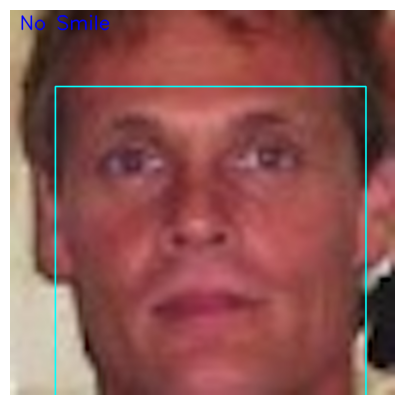

19.441084116446433


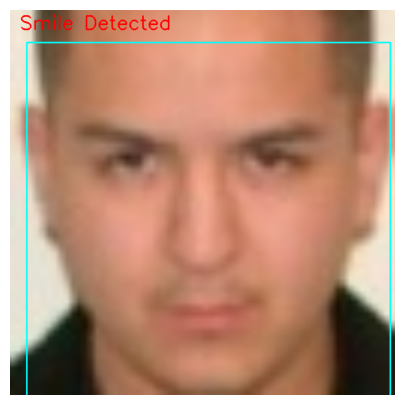

11.61864876067789


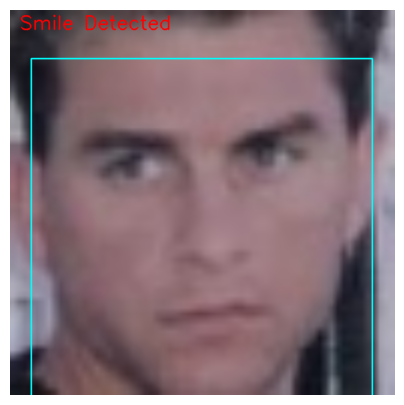

17.971974533431208


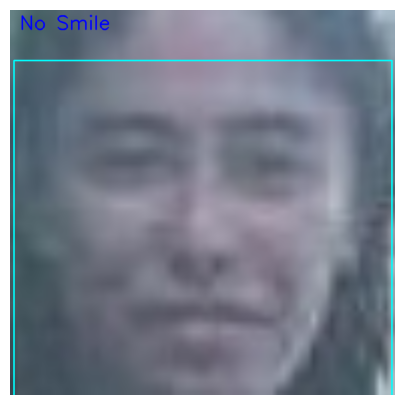

17.91545862240379


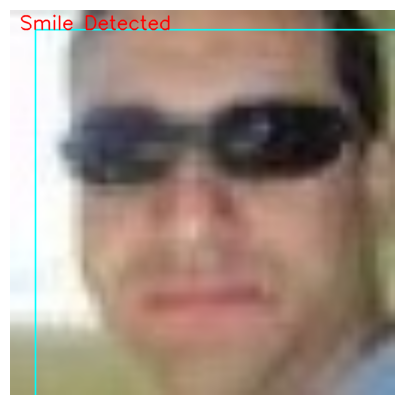

10.998808888068114


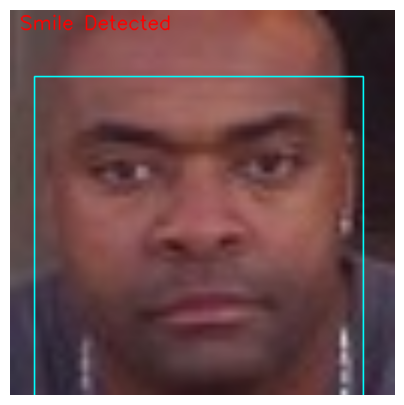

13.581234539069808


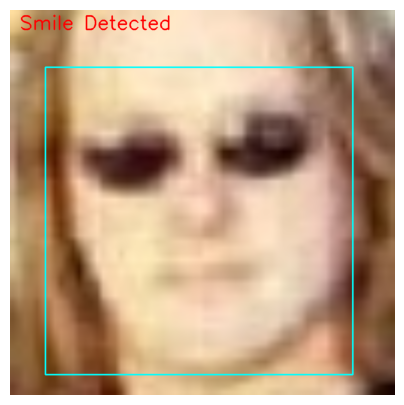

27.374813663044748


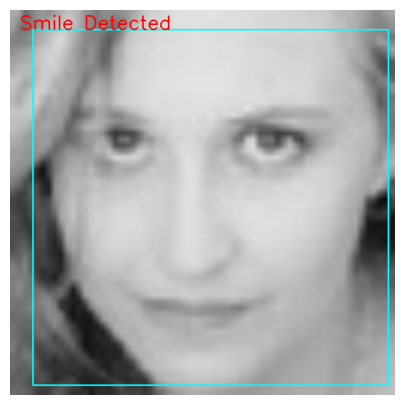

10.213436793342062


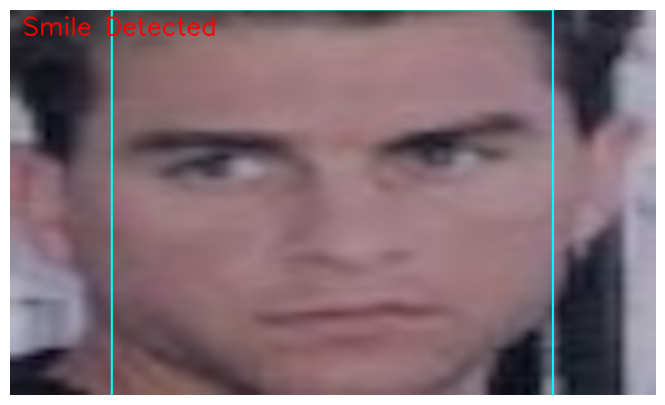

6.0935761337173435


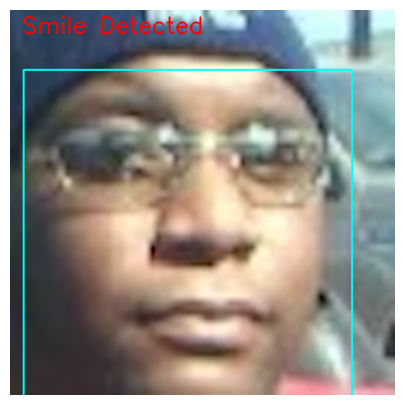

14.892777424433712


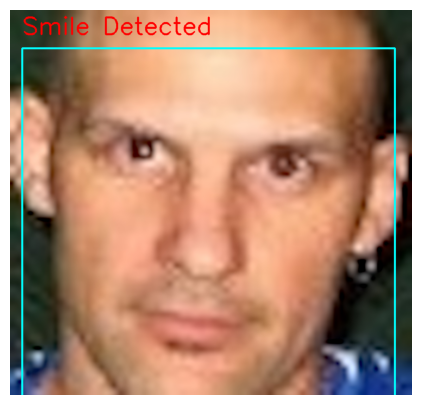

8.698050667290875


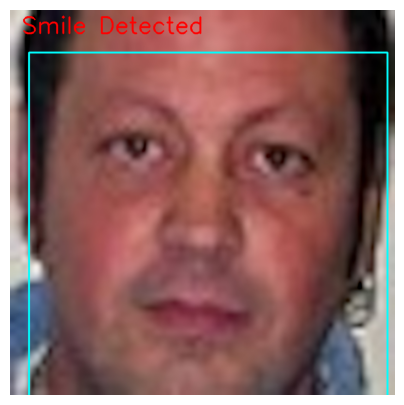

14.080351553889164


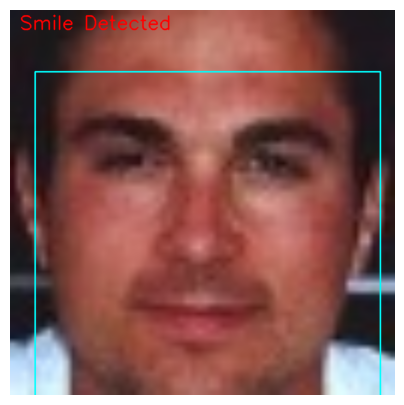

5.414758084464742


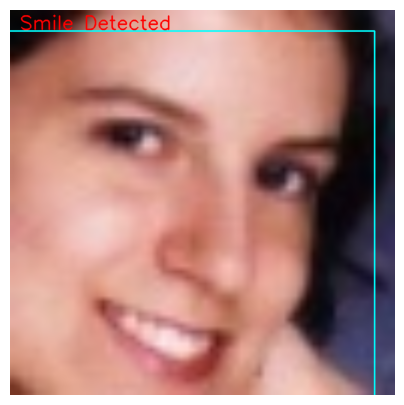

4.72833840113552


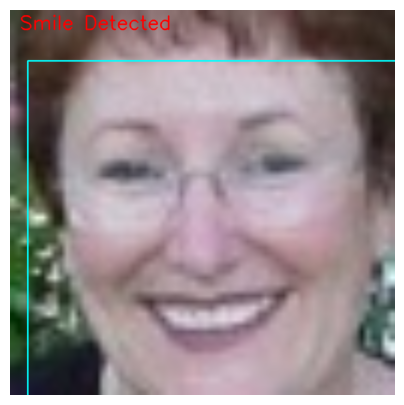

7.270920512557242


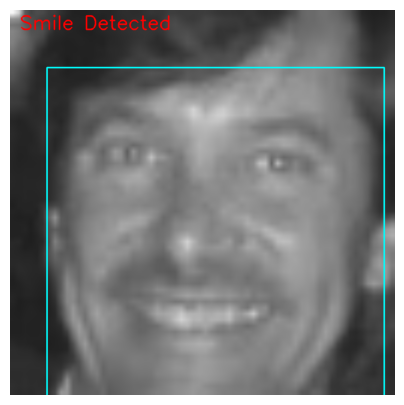

3.100081613879551


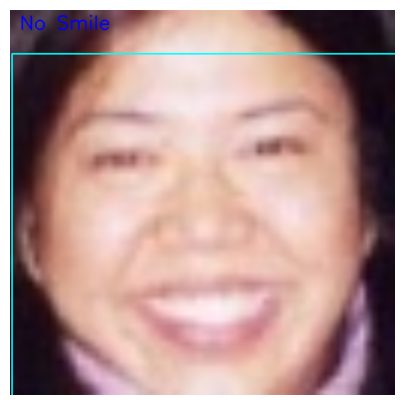

4.561244541068386


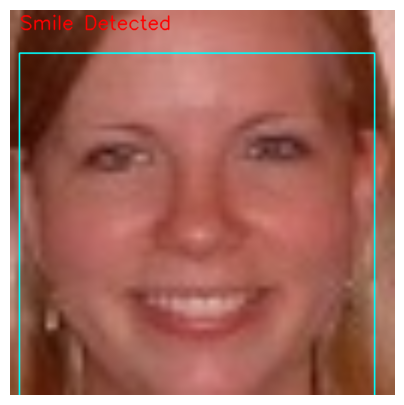

10.014400079682428


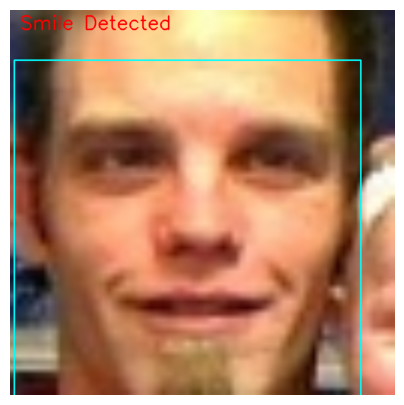

15.785357570554476


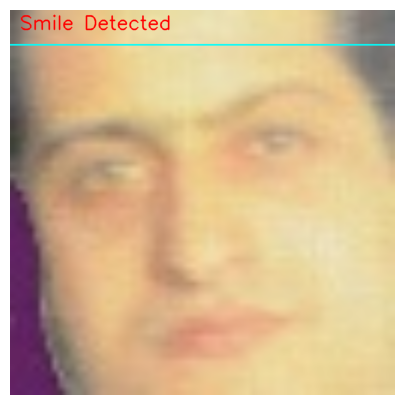

6.207274936567234


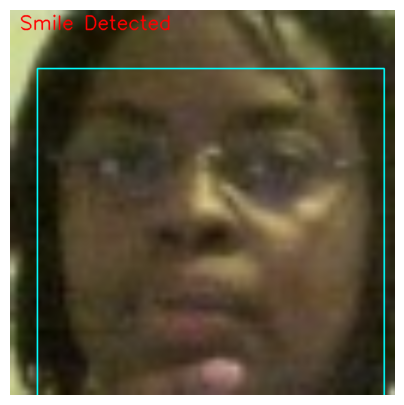

6.549661182705734


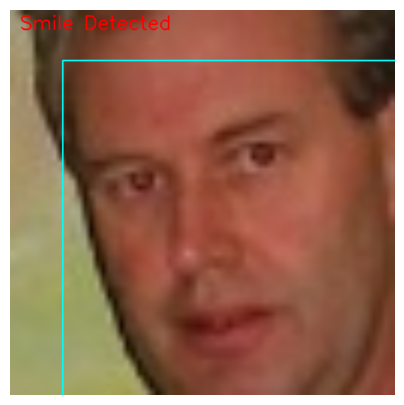

4.933428278101202


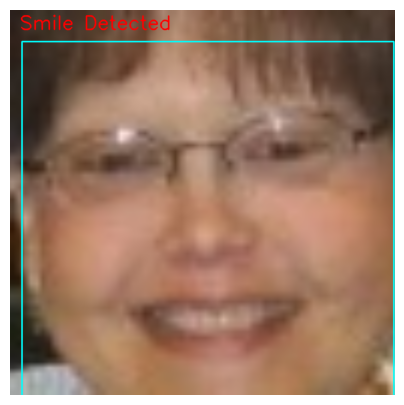

6.9424929284068355


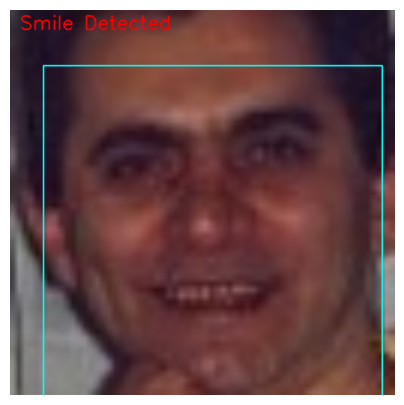

9.873731777753001


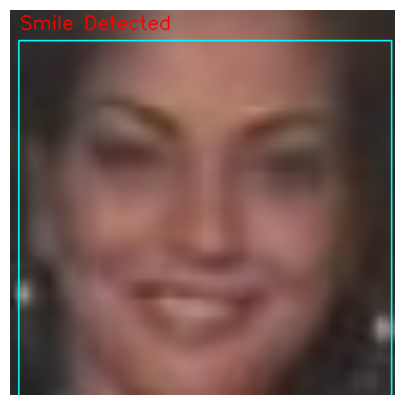

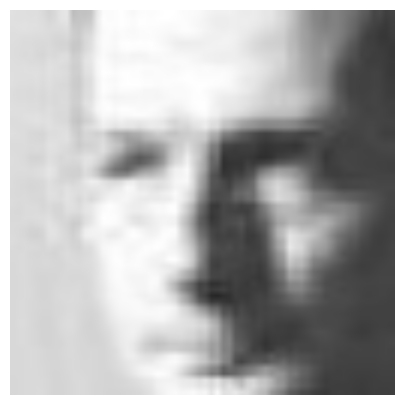

3.2164637067107704


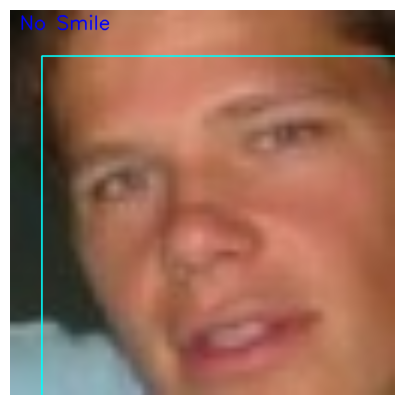

5.5084744755049355


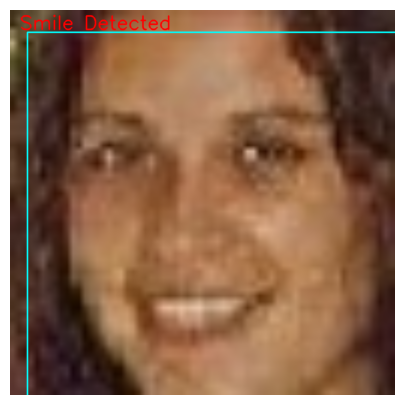

6.1783672194168355


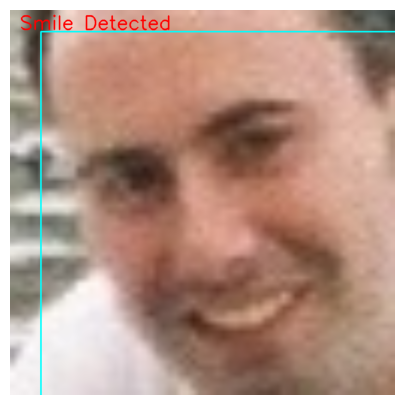

6.602014631211533


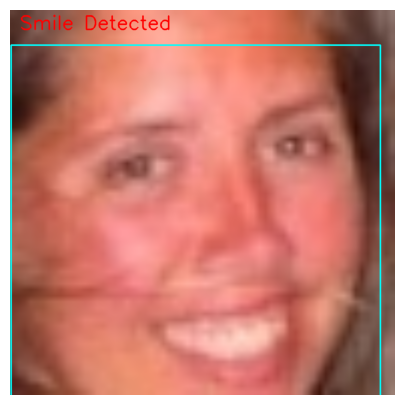

17.00870989894268


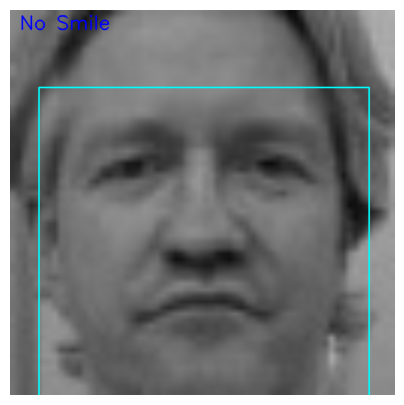

4.348413275622412


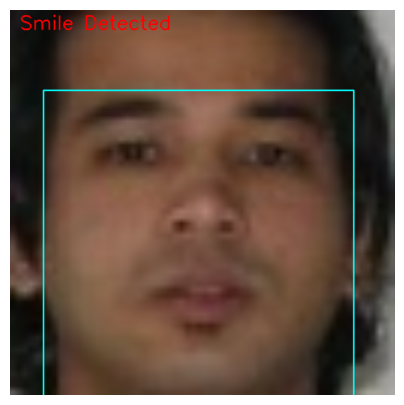

In [11]:
if __name__ == "__main__":

    desktop_folder = os.path.join("/content", "drive", "MyDrive", "Test images")
    test2_folder = os.path.join(desktop_folder, "Test 2")

    #Get a list of all the image files in the desktop folder
    image_paths = []

    for f in os.listdir(test2_folder):
        if f.endswith(".jpg") or f.endswith(".png"):
            file_path = os.path.join(test2_folder, f)
            image_paths.append(file_path)



    for image_path in image_paths:
        image = first_pipeline(image_path)
        plt.figure(figsize=(12, 5))
        plt.imshow(image[..., ::-1])
        plt.axis('off')
        plt.show()


# Running Model 2

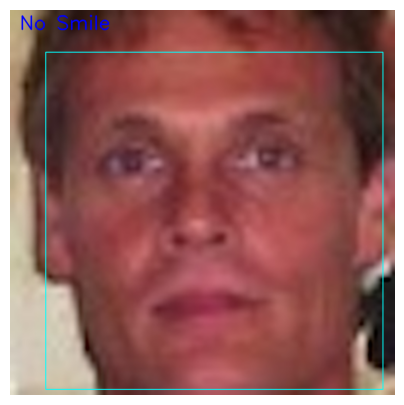

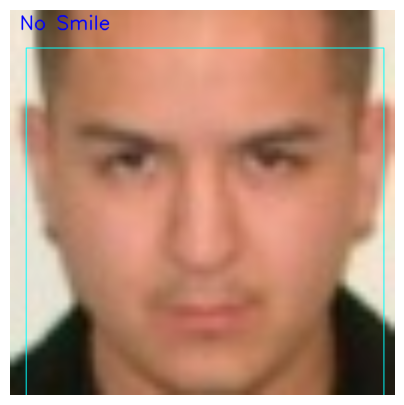

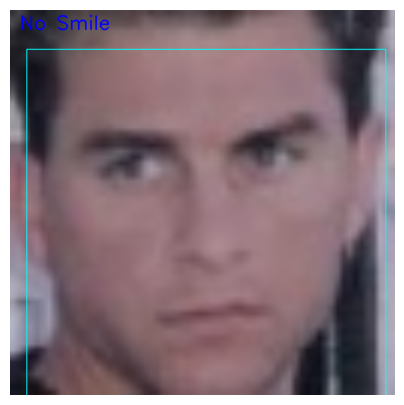

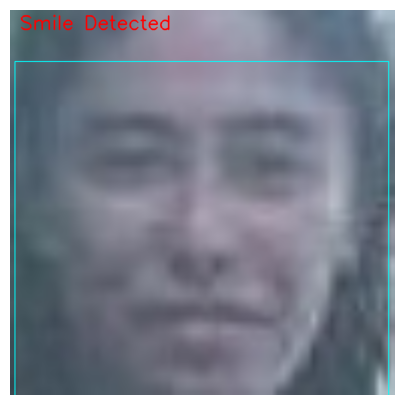

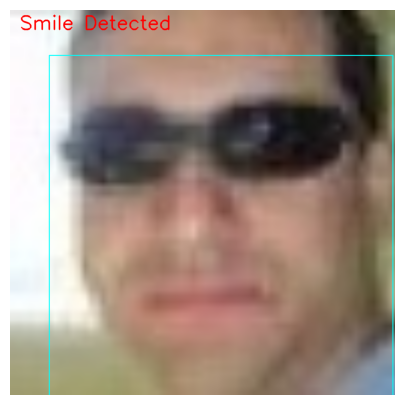

...

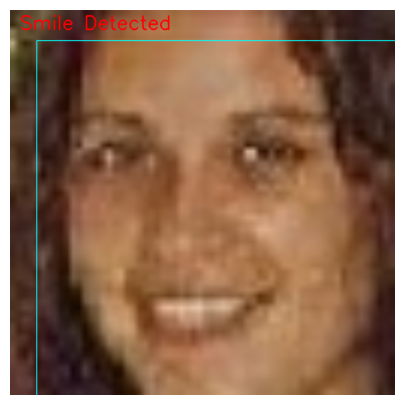

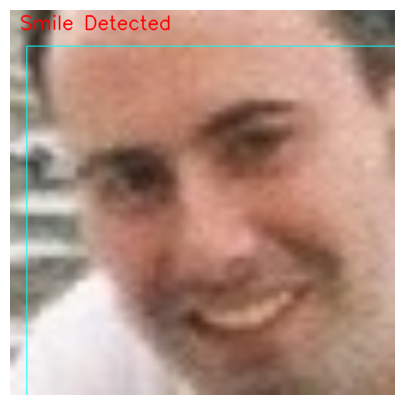

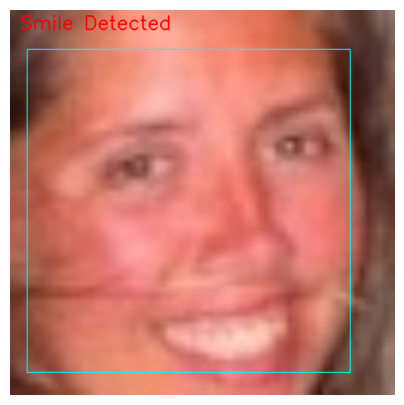

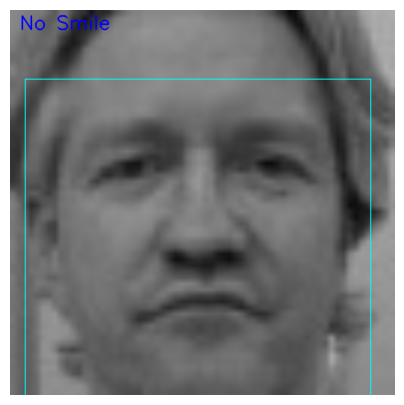

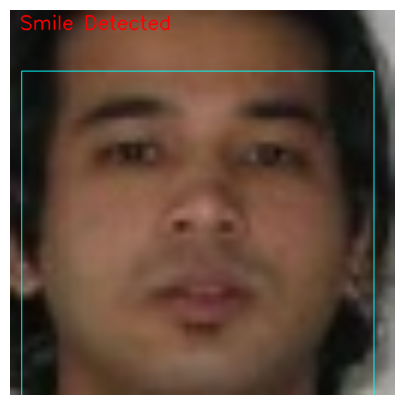

<Figure size 640x480 with 0 Axes>

In [12]:
desktop_folder = os.path.join("/content", "drive", "MyDrive", "Test images")
test2_folder = os.path.join(desktop_folder, "Test 2")

#Get a list of all the image files in the directory
image_paths = []


for f in os.listdir(test2_folder):
    if f.endswith(".jpg") or f.endswith(".png"):
        file_path = os.path.join(test2_folder, f)
        image_paths.append(file_path)



for image_path in image_paths:
    np_image = cv2.imread(image_path)
    if np_image.shape[0] < 1000 and np_image.shape[1] < 1000:
      np_image = cv2.resize(np_image, (1200, 1200), interpolation = cv2.INTER_LINEAR)
    output_image = second_pipeline(np_image)
    plt.figure(figsize=(12, 5))
    plt.imshow(output_image)
    plt.axis('off')
    plt.show()

plt.tight_layout()
plt.show()